In [1]:
import  os
import time
import pandas as pd
import requests #help us to save particular page in html
import csv
import sys
import seaborn as sns
import numpy as np

## Web Srapping

In [2]:
def retrieve_html():
    for year in range(2013, 2019):
        for month in range(1, 13):
            if(month < 10):
                url = 'https://en.tutiempo.net/climate/0{}-{}/ws-421820.html'.format(month, year)
            else:
                url = 'https://en.tutiempo.net/climate/{}-{}/ws-421820.html'.format(month, year)
                
            source_texts = requests.get(url)
            #while retreiving we also need to have utf encoding because there are some characters in html
            #that we need to fix
            text_utf = source_texts.text.encode('utf-8')

            #creating new folder system
            if not os.path.exists("/home/subarna/Documents/ML/Data/Html_data/{}".format(year)):
                os.makedirs("/home/subarna/Documents/ML/Data/Html_data/{}".format(year))
            with open("/home/subarna/Documents/ML/Data/Html_data/{}/{}.html".format(year,month),"wb") as output:
                output.write(text_utf)

        sys.stdout.flush() #gonna flush whatever is created here

In [3]:
#starting point
if __name__ == "__main__":
    start_time = time.time()
    retrieve_html()
    stop_time = time.time()
    print("time taken {}".format(stop_time - start_time))

time taken 153.6494061946869


## function to find out average of one day

In [5]:
def avg_data(year):
    average = []
    for rows in pd.read_csv('Data/AQI/aqi' + str(year) +'.csv',chunksize=24):
        add_var = 0
        avg = 0.0
        data = []
        df = pd.DataFrame(data= rows)
        for index, row in df.iterrows():
            data.append(row['PM2.5'])
        for i in data:
            if type(i) is float or type(i) is int:
                add_var = add_var +i
            elif type(i) is str:
                if i != 'NoData' and i != 'PwrFail' and i != '---' and i != 'InVld': #removing unwanted
                    temp = float(i)
                    add_var = add_var + temp
        avg = add_var/24
        
        average.append(avg)
    return average

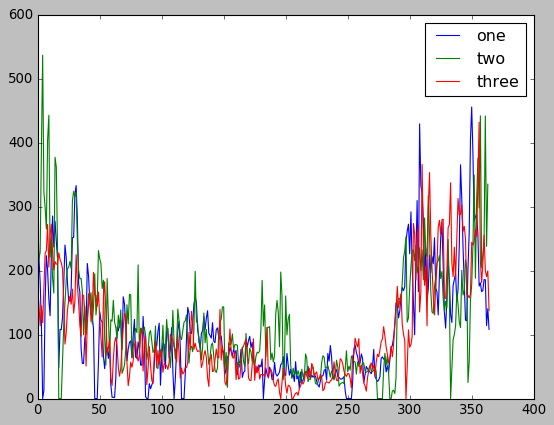

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('classic')
lst2013 = avg_data(2013)
lst2014 = avg_data(2014)
lst2015 = avg_data(2015)
plt.plot(range(0, 365), lst2013, label = 'one')
plt.plot(range(0, 364), lst2014, label = 'two')
plt.plot(range(0, 365), lst2015, label = 'three')
plt.legend(loc = 'best')
plt.show()

Winter inversion, valley effect in addition to industrial emissions, vehicular emissions are some of the reasons for the increasing amount of air pollution in winter. Dust storms, crop fires, burning of solid fuels for heating, as well as firecracker-related pollution during Diwali also increases winter pollution.

In [7]:
from bs4 import BeautifulSoup #beautiful soup is used for getting data out of html, xml, and other markup language

## extracting all independent features

In [8]:
def meta_data(month, year):
    file_html = open('Data/Html_data/{}/{}.html'.format(year, month), 'rb')
    plain_text = file_html.read() # consists all information of html file
    
    tempD = []
    finalD = []
    
    #extracting all field values
    soup = BeautifulSoup(plain_text, "lxml")
    for table in soup.findAll('table', {'class': 'medias mensuales numspan'}):
        for tbody in table:
            for tr in tbody:
                a = tr.get_text()
                tempD.append(a)
                
    rows = len(tempD)/15
    
    for times in range(round(rows)):
        newtempD = []
        for i in range(15):
            newtempD.append(tempD[0])
            tempD.pop(0)
        finalD.append(newtempD)
        
    length = len(finalD)
    
    finalD.pop(length-1)
    finalD.pop(0)
    
    #droping unrequired features
    for a in range(len(finalD)):
        finalD[a].pop(14)
        finalD[a].pop(13)
        finalD[a].pop(12)
        finalD[a].pop(11)
        finalD[a].pop(10)
        finalD[a].pop(6)
        finalD[a].pop(0)  
        
    return finalD

In [10]:
#combining all csv files to one
def data_combine(year, cs):
    for a in pd.read_csv('Data/Real_data/real_' + str(year) + '.csv', chunksize= cs):
        df = pd.DataFrame(data =a)
        mylist = df.values.tolist()
    return mylist

## Preparing our data file

In [11]:
if __name__ == "__main__":
    if not os.path.exists("Data/Real_data"):
        os.makedirs("Data/Real_data")
    for year in range(2013, 2019):
        final_data = []
        with open("Data/Real_data/real_" + str(year) + '.csv', 'w') as csvfile:
            wr = csv.writer(csvfile, dialect ='excel')
            wr.writerow([
                'T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'
            ])
        for month in range(1, 13):
            temp = meta_data(month, year)
            final_data = final_data + temp
            
        pm = avg_data(year)#dynamic way to call attributes
        
        if len(pm) == 364:
            pm.insert(364, '-')
            
        for i in range(0, len(final_data)-1):
            final_data[i].insert(8, pm[i])
            
        with open('Data/Real_data/real_' + str(year) + '.csv', 'a') as csvfile:
            wr = csv.writer(csvfile, dialect ='excel')
            for row in final_data:
                flag = 0
                for elem in row:
                    if elem == "" or elem == "-":
                        flag = 1
                if flag != 1:
                    wr.writerow(row)
                    
    data_2013 = data_combine(2013, 400)
    data_2014 = data_combine(2014, 400)
    data_2015 = data_combine(2015, 400)
    data_2016 = data_combine(2016, 400)
    data_2017 = data_combine(2017, 400)
    data_2018 = data_combine(2018, 400)
    
    total = data_2013 + data_2014 + data_2015 + data_2016 + data_2017 + data_2018
    
    with open('Data/Real_data/Real_combine.csv', 'w') as csvfile:
        wr = csv.writer(csvfile, dialect ='excel')
        wr.writerow([
                'T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'
            ])
        wr.writerows(total)

In [3]:
df = pd.read_csv('Data/Real_data/Real_combine.csv')

In [5]:
df

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833
...,...,...,...,...,...,...,...,...,...
1084,12.3,22.4,4.0,1017.9,74.0,1.3,1.1,3.5,188.041667
1085,11.3,22.3,4.7,1017.7,82.0,1.1,3.0,3.5,310.250000
1086,12.3,19.4,6.2,1016.8,80.0,1.3,6.7,25.9,204.375000
1087,11.1,20.6,3.6,1015.7,76.0,1.3,3.0,9.4,223.250000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1088 entries, 0 to 1088
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   T       1088 non-null   float64
 1   TM      1088 non-null   float64
 2   Tm      1088 non-null   float64
 3   SLP     1088 non-null   float64
 4   H       1088 non-null   float64
 5   VV      1088 non-null   float64
 6   V       1088 non-null   float64
 7   VM      1088 non-null   float64
 8   PM 2.5  1088 non-null   float64
dtypes: float64(9)
memory usage: 85.0 KB


In [7]:
df.describe()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
count,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000
mean,25.701471,32.468199,19.343658,1007.942096,63.336397,2.009467,6.487776,15.662316,108.255729
std,7.216849,6.680750,7.570776,7.537081,15.849188,0.728429,3.892125,7.567607,82.288271
min,6.700000,9.800000,0.000000,990.400000,20.000000,0.300000,0.400000,1.900000,0.000000
25%,19.000000,27.775000,12.100000,1001.200000,54.000000,1.600000,3.500000,11.100000,43.958333
50%,27.950000,34.400000,21.400000,1007.900000,65.000000,1.900000,5.900000,14.800000,83.458333
75%,31.400000,37.000000,26.000000,1014.800000,75.000000,2.600000,8.900000,18.300000,152.686458
max,38.500000,45.500000,34.000000,1023.200000,98.000000,5.800000,24.400000,57.600000,404.500000


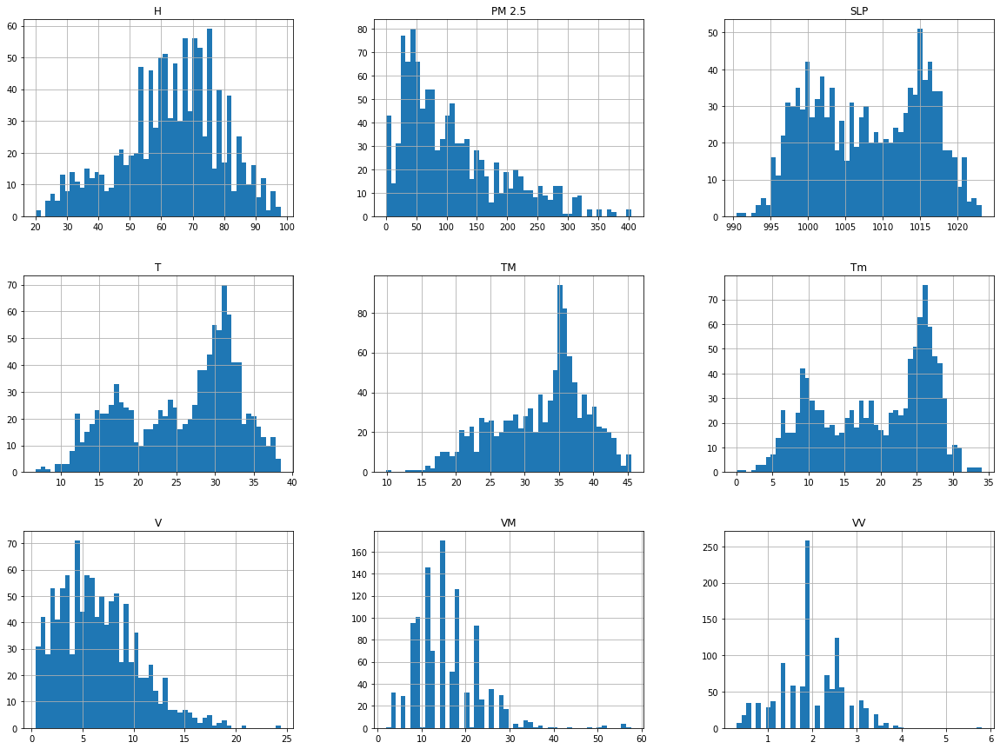

In [11]:
df.hist(bins=50, figsize=(20,15))
plt.show()

In [22]:
print(df['V'].skew())
print(df['VM'].skew())

0.7424545692689404
1.4280312511808326


In [25]:
from scipy import stats
print(pd.Series(stats.boxcox(df['V'])[0]).skew())
print(pd.Series(stats.boxcox(df['VM'])[0]).skew())

-0.06405526399278783
0.018778234474351892


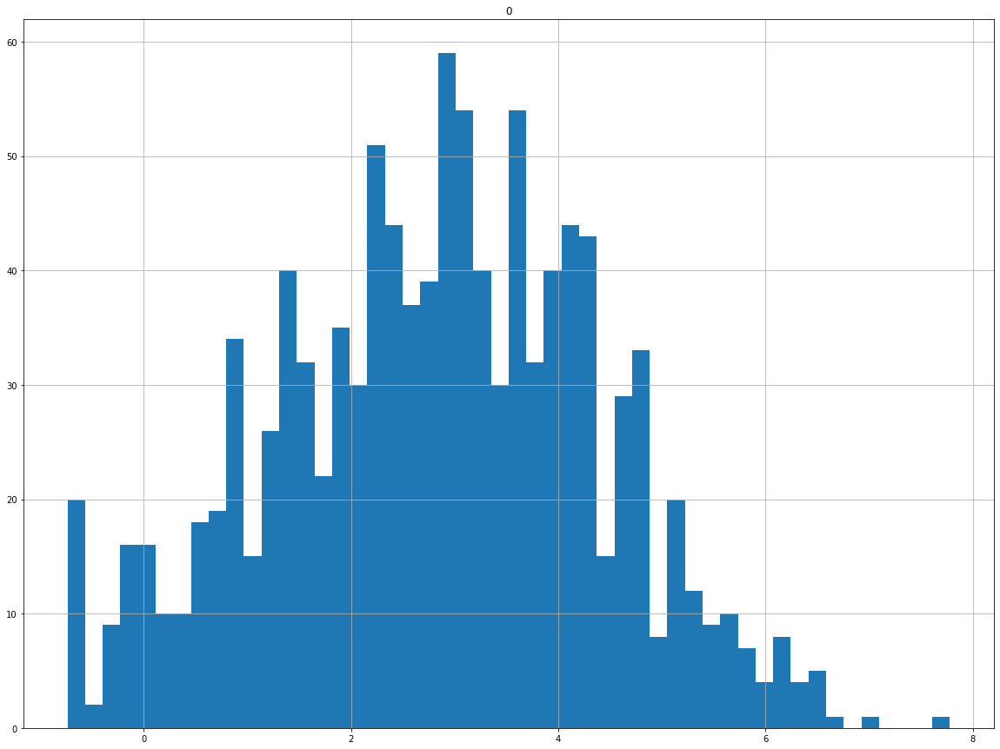

In [27]:
x1 = pd.DataFrame(stats.boxcox(df['V'])[0])
x2 = pd.DataFrame(stats.boxcox(df['VM'])[0])
x1.hist(bins=50, figsize=(20,15))
plt.show()

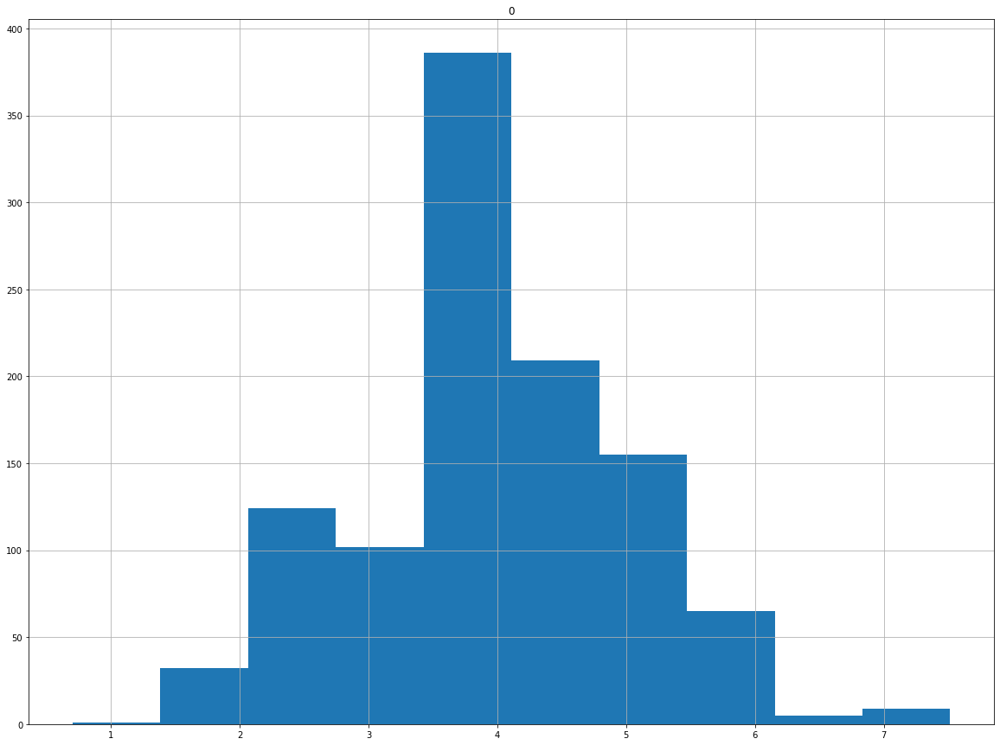

In [29]:
x2.hist(bins=10, figsize=(20,15))
plt.show()

#### some columns are approximated to normal distribution by removing skewness

In [30]:
df['V'] = stats.boxcox(df['V'])[0]
df['VM'] = stats.boxcox(df['VM'])[0]

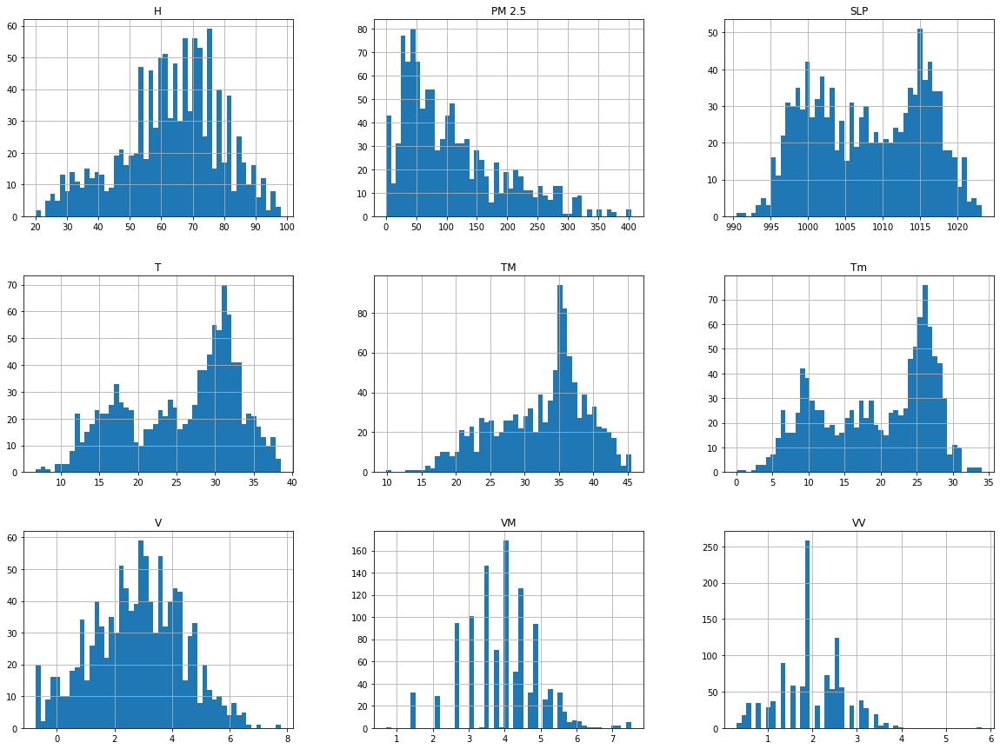

In [31]:
df.hist(bins=50, figsize=(20,15))
plt.show()

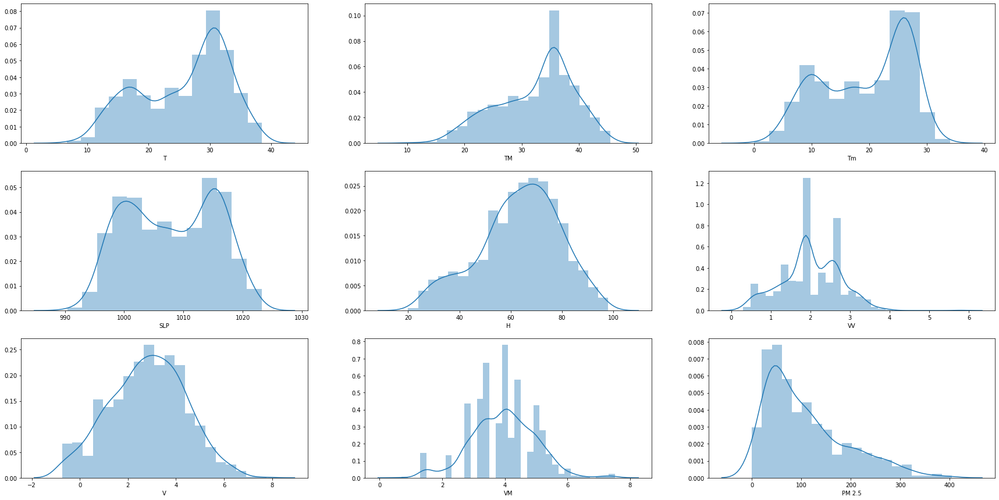

In [47]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30,15))
for i, column in enumerate(df.columns):
    sns.distplot(df[column],ax=axes[i//3,i%3])

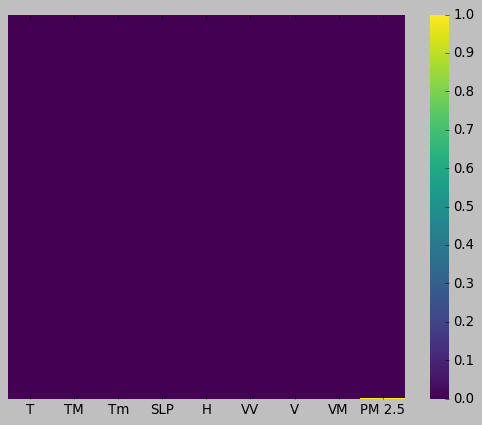

In [14]:
# check for null values
sns.heatmap(df.isnull(), yticklabels=False, cbar=True, cmap='viridis')

In [15]:
df.isnull()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
1085,False,False,False,False,False,False,False,False,False
1086,False,False,False,False,False,False,False,False,False
1087,False,False,False,False,False,False,False,False,False
1088,False,False,False,False,False,False,False,False,False


In [4]:
df = df.dropna()

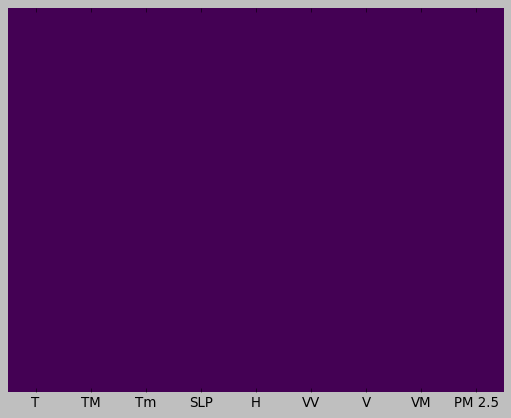

In [17]:
# check for null values
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [48]:
x = df.iloc[:, :-1] ## independent features
y = df.iloc[:,-1] ## dependent features

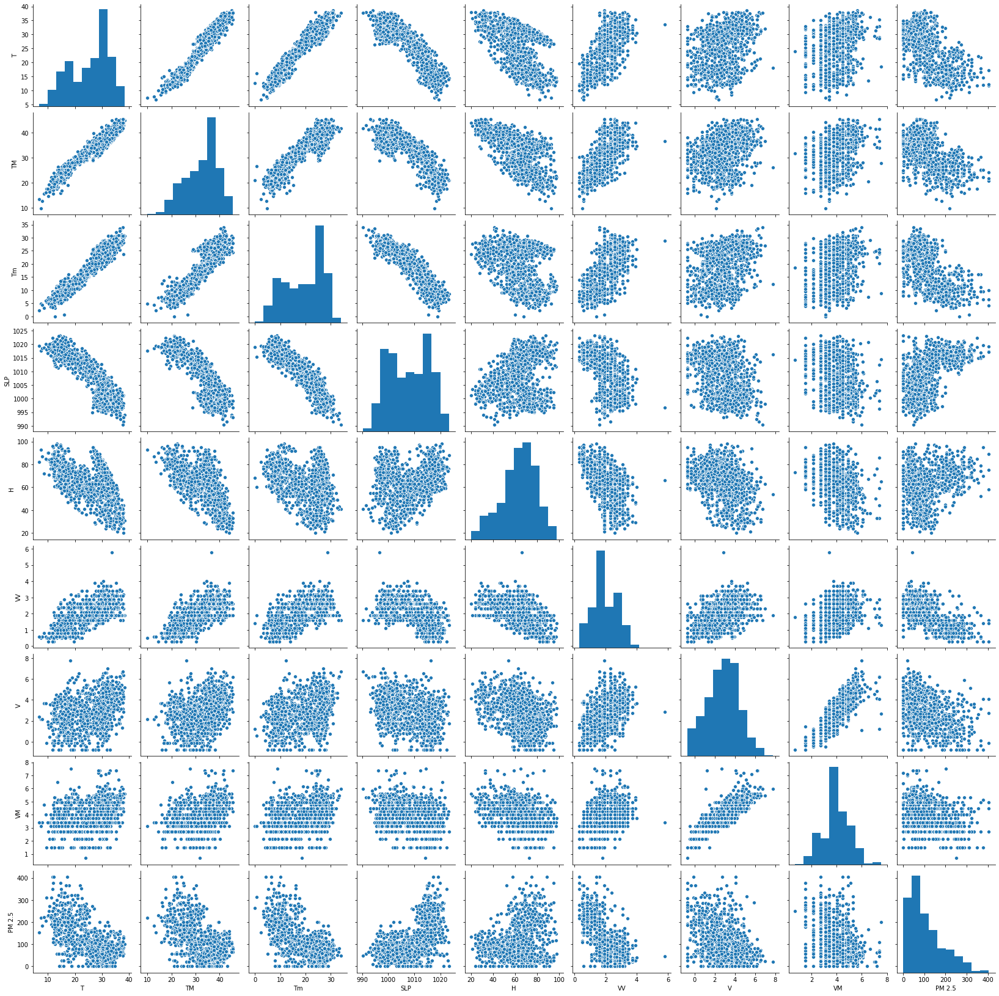

In [49]:
sns.pairplot(df)

In [50]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.963416,0.957227,-0.883207,-0.488919,0.625547,0.326539,0.291077,-0.629693
TM,0.963416,1.000000,0.889979,-0.826008,-0.576799,0.598727,0.305809,0.294046,-0.565459
Tm,0.957227,0.889979,1.000000,-0.912333,-0.275047,0.547490,0.317444,0.260834,-0.661733
SLP,-0.883207,-0.826008,-0.912333,1.000000,0.231971,-0.483494,-0.335845,-0.291121,0.605637
H,-0.488919,-0.576799,-0.275047,0.231971,1.000000,-0.489597,-0.358062,-0.383325,0.166577
VV,0.625547,0.598727,0.547490,-0.483494,-0.489597,1.000000,0.401992,0.371140,-0.593327
V,0.326539,0.305809,0.317444,-0.335845,-0.358062,0.401992,1.000000,0.844484,-0.349951
VM,0.291077,0.294046,0.260834,-0.291121,-0.383325,0.371140,0.844484,1.000000,-0.298910
PM 2.5,-0.629693,-0.565459,-0.661733,0.605637,0.166577,-0.593327,-0.349951,-0.298910,1.000000


### heat map makes it very easy to identify which features are most related to the target variable

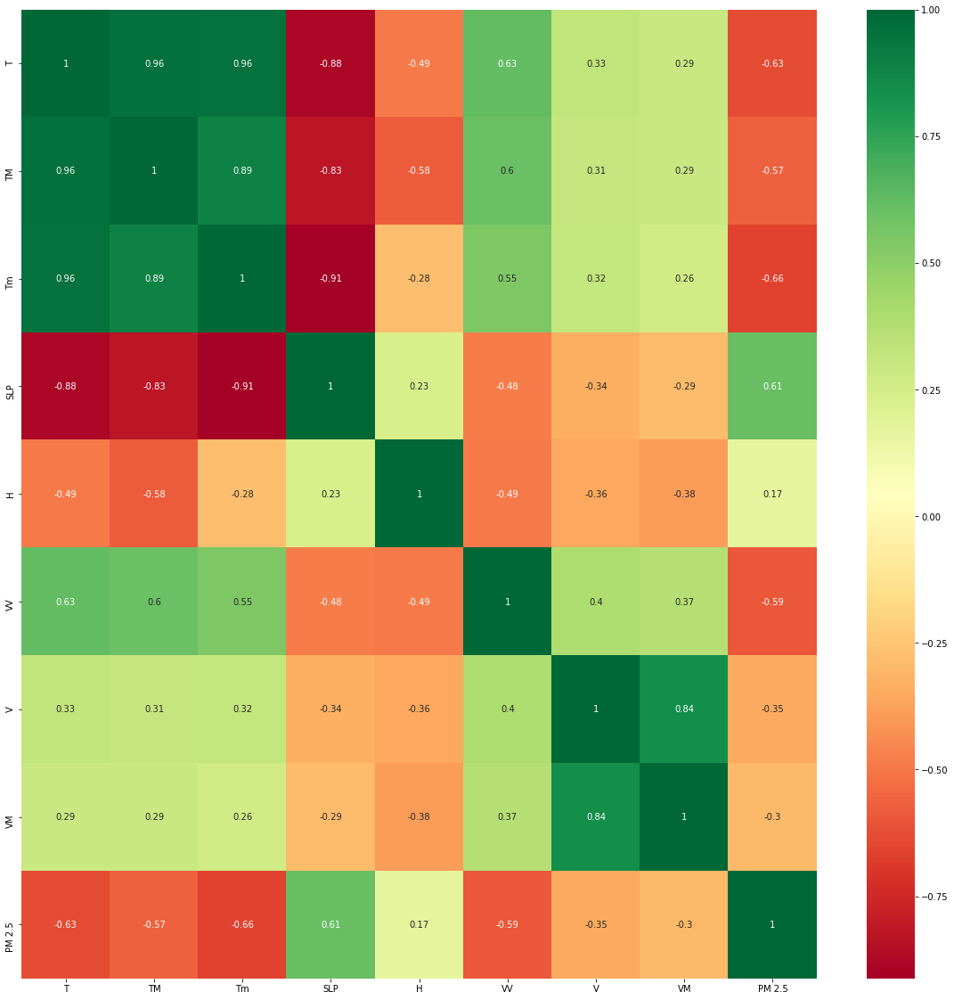

In [51]:
import matplotlib.pyplot as plt
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20, 20))
g = sns.heatmap(df[top_corr_features].corr(), annot = True, cmap = "RdYlGn")

### feature importance 
gives you score more important or relevant towards your output variable
feature importance is an inbuilt class that comes with tree based classifiers, we will be using extra tree regressor for extracting top 10 features for the dataset

In [52]:
from sklearn.ensemble import ExtraTreesRegressor #solves outlier problem
model  = ExtraTreesRegressor()
model.fit(x,y)

ExtraTreesRegressor()

In [53]:
model.feature_importances_

array([0.16246312, 0.08090692, 0.20787897, 0.16155593, 0.076394  ,
       0.20302198, 0.06083246, 0.04694663])

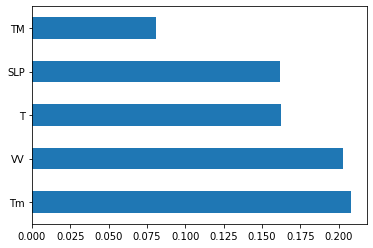

In [54]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index = x.columns)
feat_importances.nlargest(5).plot(kind = 'barh')
plt.show()

#### all available features are well correlated with PM2.5

## Linear Regression

In [71]:
#train-test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

In [72]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [73]:
from sklearn.linear_model import LinearRegression
regression = LinearRegression()
regression.fit(X_train, y_train)

LinearRegression()

In [74]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(870, 8)
(870,)
(218, 8)
(218,)


In [75]:
regression.score(X_test,y_test)

0.5597879848802305

In [58]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(regression, x, y, cv = 5)
score.mean()

0.49748562052567025

In [76]:
print("print R^2 coefficient of model: {}".format(regression.score(X_train, y_train)))
#Usually, the larger the R2, the better the regression model fits your observations.

print R^2 coefficient of model: 0.5399448554451226


In [29]:
print("print R^2 coefficient of model: {}".format(regression.score(X_test, y_test)))
#Usually, the larger the R2, the better the regression model fits your observations.

print R^2 coefficient of model: 0.5479181735684493


#### Normalization = x -xmin/ xmax – xmin   Zero Score Standardization = x - xmean/ xstd  
#### most algorithms will probably benefit from standardization more so than from normalization.
#### One disadvantage of normalization over standardization is that it loses some information in the data, especially about outliers.

In [77]:
regression.coef_

array([ -6.62902671,   7.87773084, -40.53437611,  -2.34111853,
       -14.63795669, -30.84166956,  -4.92624713,  -3.66857242])

In [78]:
regression.intercept_

106.55603448275862

In [79]:
#model evaluation
coeff_df = pd.DataFrame(regression.coef_, x.columns, columns=['Coefficient'])
coeff_df

,Coefficient
T,-6.629027
TM,7.877731
Tm,-40.534376
SLP,-2.341119
H,-14.637957
VV,-30.841670
V,-4.926247
VM,-3.668572


Interpretation of coefficients:
    holding all other features fixed, an unit increase in T is associated with an increase of 0.603 in PM2.5
    holding all other features fixed, an unit increase in TM is associated with an increase of 0.8689 in PM2.5

In [80]:
prediction = regression.predict(X_test)

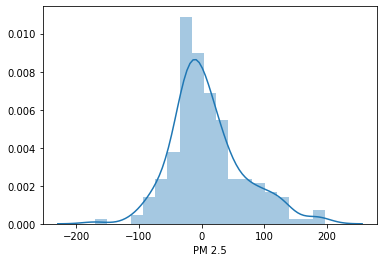

In [81]:
sns.distplot(y_test - prediction) #bell shape curve

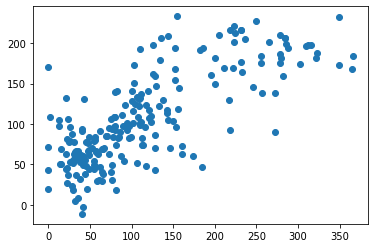

In [82]:
plt.scatter(y_test, prediction)

 regression evaluation metrics
 MAE, MSE, RMSE
 if we are getting bell curve and linear scatter plot we can say we are in right path

In [83]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 42.36654850277334
MSE: 3376.7300789805445
RMSE: 58.1096384344331


#### cope up with random state:
    Fix the random state from the start and don’t touch it!
    Use the prediction results as an interval
    Reduce imbalance/randomness in data split

In [41]:
from sklearn.externals import joblib
joblib.dump(regression, 'regeression_model.pkl')

/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


['regeression_model.pkl']

In [43]:
mse = cross_val_score(regression, x, y, scoring='neg_mean_squared_error')
mean_mse = np.mean(mse)
print(mean_mse)

-3363.347735049972


## ridge regression

In [84]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
ridge = Ridge()
parameters = {'alpha':[1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20]}

In [85]:
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv = 5)
ridge_regressor.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20]},
             scoring='neg_mean_squared_error')

In [86]:
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

{'alpha': 20}
-3063.894489105552


In [94]:
ridge = Ridge(alpha= 20)
ridge.fit(X_train, y_train)
ridge.score(X_test, y_test)

0.5580735083068125

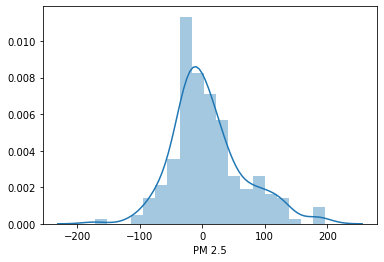

In [90]:
predic = ridge.predict(X_test)
sns.distplot(y_test-predic)

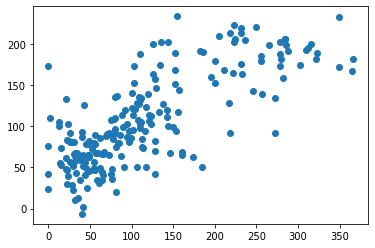

In [95]:
plt.scatter(y_test, predic)

In [96]:
#from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predic))
print('MSE:', metrics.mean_squared_error(y_test, predic))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predic)))
# performs very well when there are many different features

MAE: 42.55400080880186
MSE: 3397.168864161197
RMSE: 58.28523710307093


## lasso regression

In [89]:
from sklearn.linear_model import Lasso
lasso = Lasso()
parameters = {'alpha':[1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20, 30, 40, 45]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv = 5)
lasso_regressor.fit(X_train, y_train)
print(lasso_regressor.best_params_)
print(lasso_regressor.best_score_)

/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1063354.3960141172, tolerance: 474.6245641403033
  positive)
/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1002017.8580393466, tolerance: 443.44381721467664
  positive)
/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1024024.8649940724, tolerance: 438.02057502800733
  positive)
/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to inc

{'alpha': 1}
-3047.2551955935087


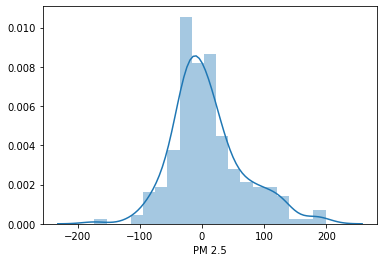

In [91]:
predic = lasso_regressor.predict(X_test)
sns.distplot(y_test-predic)

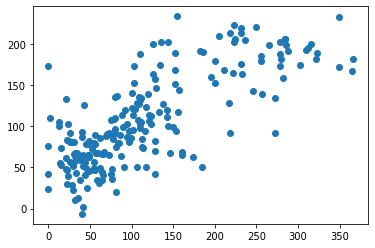

In [92]:
plt.scatter(y_test, predic)

In [93]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predic))
print('MSE:', metrics.mean_squared_error(y_test, predic))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predic)))
# performs very well when there are many different features

MAE: 42.55400080880186
MSE: 3397.168864161197
RMSE: 58.28523710307093


In [52]:
from sklearn.externals import joblib
joblib.dump(regression, 'lasso_reg_model.pkl')

['lasso_reg_model.pkl']

#### lasso regression is performing better than ridge

## decision tree

In [97]:
from sklearn.tree import DecisionTreeRegressor

In [98]:
tree = DecisionTreeRegressor(criterion= "mse")

In [99]:
score = cross_val_score(tree, X_train, y_train, cv = 5)
print(score.mean()) #overfit

0.18418733078989455


In [100]:
tree.fit(X_train, y_train)
print("print R^2 coefficient of model: {}".format(tree.score(X_train, y_train)))
print("print R^2 coefficient of model: {}".format(tree.score(X_test, y_test)))

print R^2 coefficient of model: 1.0
print R^2 coefficient of model: 0.28861154231166664


## Tree Vizualization

In [101]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz

/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [102]:
import pydotplus

In [103]:
features = list(df.columns[:-1]) #export graphviz used to take list
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [104]:
dot_data=  StringIO()
export_graphviz(tree, out_file= dot_data, feature_names= features, filled = True, rounded= True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.703804 to fit



## Hyperparameter tuning decision tree

In [105]:
params = {
    "splitter" : ["best", "random"],
    "max_depth" : [3,4,5,6,8,10,12,15],
    "min_samples_leaf" : [1,2,3,4,5],
    "min_weight_fraction_leaf" : [0.1,0.2,0.3,0.4],
    "max_features" : ["auto", "log2", "sqrt", None],
    "max_leaf_nodes" : [None, 10,20,30,40,50,60,70]
}

In [106]:
g_search = GridSearchCV(tree, param_grid= params, scoring = "neg_mean_squared_error", n_jobs=-1, cv = 10, verbose = 2)

In [67]:
def timer(start_time = None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(),3600)
        tmon, tsec = divmod(temp_sec, 60)
        print("\n Time taken: {} hours {} minutes and {} seconds".format(thour, tmin, round(tsec, 2)))

In [107]:
import time
start_time = time.time()
g_search.fit(X_train, y_train)
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 5776 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 18768 tasks      | elapsed:   29.8s
[Parallel(n_jobs=-1)]: Done 36880 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 60240 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 88720 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  3.2min finished


--- 191.55526494979858 seconds ---


In [108]:
g_search.best_params_

{'max_depth': 15,
 'max_features': 'log2',
 'max_leaf_nodes': 20,
 'min_samples_leaf': 4,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [109]:
g_search.best_score_

-3155.4061176458663

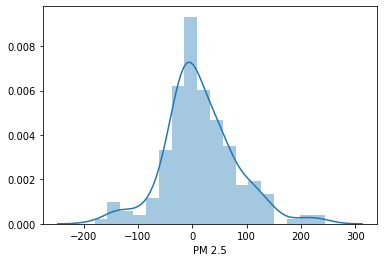

In [110]:
prediction = g_search.predict(X_test)
sns.distplot(y_test - prediction)

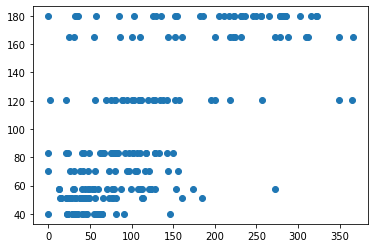

In [111]:
plt.scatter(y_test, prediction)

In [112]:
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))
# performs very well when there are many different features

MAE: 49.21193802565615
MSE: 4616.4756493604955
RMSE: 67.9446513668331


In [ ]:
score = cross_val_score(g, X_train, y_train, cv = 5)
print(score.mean())

In [74]:
joblib.dump(g_search, 'tree.pkl')

['tree.pkl']

## Random Forest

In [113]:
from sklearn.ensemble import RandomForestRegressor

In [114]:
regressor = RandomForestRegressor()
score = cross_val_score(regressor, X_train,y_train, cv = 5)
score.mean()

0.5583174293315178

In [115]:
regressor.fit(X_train, y_train)
print("print R^2 coefficient of model: {}".format(regressor.score(X_train, y_train)))
print("print R^2 coefficient of model: {}".format(regressor.score(X_test, y_test)))

print R^2 coefficient of model: 0.9402169867073127
print R^2 coefficient of model: 0.6533802187728265


#### Randomized Search CV

In [116]:
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
print(n_estimators)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]


In [117]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]
# Method of selecting samples for training each tree
# bootstrap = [True, False]


In [118]:
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [119]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
rf_random = RandomizedSearchCV(estimator = regressor, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)

In [120]:
start_time = time.time()
rf_random.fit(X_train,y_train)
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   19.6s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  8.0min finished


--- 485.97992992401123 seconds ---


In [135]:
rf_random.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 10}

In [136]:
rf_random.best_score_

-2685.0690527158795

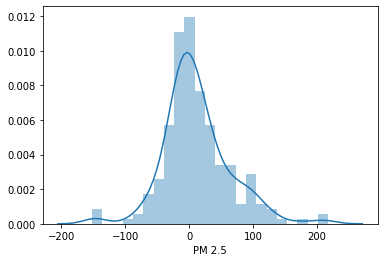

In [137]:
predictions=rf_random.predict(X_test)
sns.distplot(y_test-predictions)

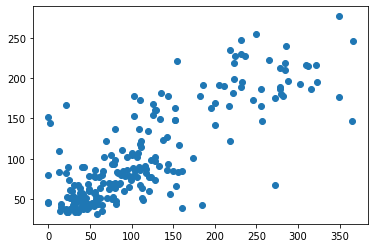

In [138]:
plt.scatter(y_test,predictions)

In [139]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 37.27965586853587
MSE: 2851.068964667342
RMSE: 53.39540209294562


## Xgboost

In [127]:
import xgboost as xgb

In [128]:
xg_reg = xgb.XGBRegressor()
xg_reg.fit(X_train,y_train)
print("Coefficient of determination R^2 <-- on train set: {}".format(xg_reg.score(X_train, y_train)))
print("Coefficient of determination R^2 <-- on train set: {}".format(xg_reg.score(X_test, y_test)))

Coefficient of determination R^2 <-- on train set: 0.9980250222893996
Coefficient of determination R^2 <-- on train set: 0.6083084034179584


In [129]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
print(n_estimators)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]


#### Randomized Search CV

In [130]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Various learning rate parameters
learning_rate = ['0.05','0.1', '0.2','0.3','0.5','0.6']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
#Subssample parameter values
subsample=[0.7,0.6,0.8]
# Minimum child weight parameters
min_child_weight=[3,4,5,6,7]

In [131]:
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'learning_rate': learning_rate,
               'max_depth': max_depth,
               'subsample': subsample,
               'min_child_weight': min_child_weight}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'learning_rate': ['0.05', '0.1', '0.2', '0.3', '0.5', '0.6'], 'max_depth': [5, 10, 15, 20, 25, 30], 'subsample': [0.7, 0.6, 0.8], 'min_child_weight': [3, 4, 5, 6, 7]}


In [132]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
regressor=xgb.XGBRegressor()

In [133]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
xg_random = RandomizedSearchCV(estimator = regressor, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)

In [134]:
start_time = time.time()
xg_random.fit(X_train,y_train)
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  2.9min


--- 230.0490689277649 seconds ---


[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  3.8min finished


In [140]:
xg_random.best_params_

{'subsample': 0.6,
 'n_estimators': 100,
 'min_child_weight': 6,
 'max_depth': 15,
 'learning_rate': '0.05'}

In [141]:
xg_random.best_score_

-2885.653808040258

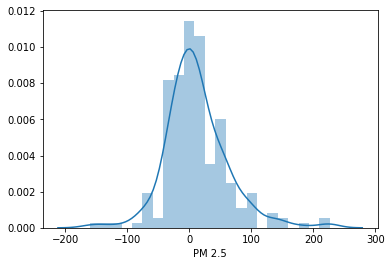

In [142]:
predictions=xg_random.predict(X_test)
sns.distplot(y_test-predictions)

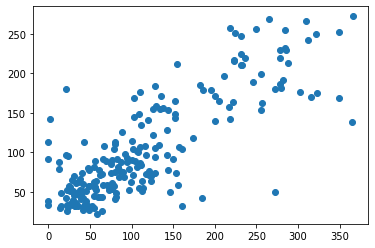

In [143]:
plt.scatter(y_test,predictions)

In [144]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 36.32465385005379
MSE: 2760.0730708732704
RMSE: 52.536397581802945


In [115]:
joblib.dump(g_search, 'xg.pkl')

['xg.pkl']

## KNN

In [145]:
from sklearn.neighbors import KNeighborsRegressor
regressor=KNeighborsRegressor(n_neighbors=1)
regressor.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=1)

In [146]:
print("Coefficient of determination R^2 <-- on train set: {}".format(regressor.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [147]:
print("Coefficient of determination R^2 <-- on train set: {}".format(regressor.score(X_test, y_test)))

Coefficient of determination R^2 <-- on train set: 0.3323339699845961


In [148]:
accuracy_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsRegressor(n_neighbors=i)
    score=cross_val_score(knn,x,y,cv=10,scoring="neg_mean_squared_error")
    accuracy_rate.append(score.mean())

Text(0, 0.5, 'Accuracy Rate')

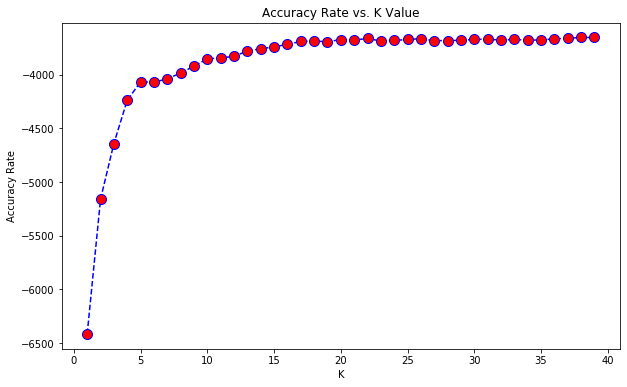

In [149]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
#plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
 #        markerfacecolor='red', markersize=10)
plt.title('Accuracy Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy Rate')

In [150]:
# FIRST A QUICK COMPARISON TO OUR ORIGINAL K=1
knn = KNeighborsRegressor(n_neighbors=40)

knn.fit(X_train,y_train)
predictions = knn.predict(X_test)

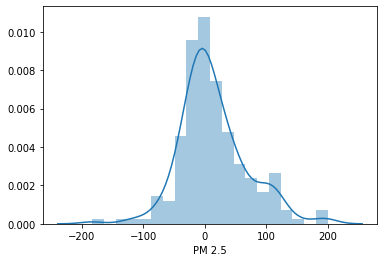

In [151]:
sns.distplot(y_test-predictions)

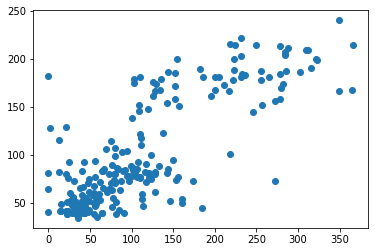

In [152]:
plt.scatter(y_test,predictions)

In [153]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 40.104648318042805
MSE: 3181.0198750898917
RMSE: 56.40053080503668


## ANN

In [154]:

# Importing the Keras libraries and packages
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU,PReLU,ELU
from keras.layers import Dropout

Using TensorFlow backend.


In [155]:
NN_model = Sequential()

# The Input Layer :
NN_model.add(Dense(128, kernel_initializer='normal',input_dim = X_train.shape[1], activation='relu'))

# The Hidden Layers :
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model.summary()

# Fitting the ANN to the Training set
model_history=NN_model.fit(X_train, y_train,validation_split=0.2, batch_size = 10, nb_epoch = 50)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 128)               1152      
_________________________________________________________________
dense_2 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_3 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_4 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 257       
Total params: 166,017
Trainable params: 166,017
Non-trainable params: 0
_________________________________________________________________


/home/subarna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.


Train on 696 samples, validate on 174 samples
Epoch 1/50
696/696 [==============================] - 3s 5ms/step - loss: 66.0395 - mean_absolute_error: 66.0396 - val_loss: 42.1637 - val_mean_absolute_error: 42.1637
Epoch 2/50
696/696 [==============================] - 1s 2ms/step - loss: 39.3535 - mean_absolute_error: 39.3535 - val_loss: 38.7094 - val_mean_absolute_error: 38.7094
Epoch 3/50
696/696 [==============================] - 1s 2ms/step - loss: 39.1636 - mean_absolute_error: 39.1636 - val_loss: 37.5814 - val_mean_absolute_error: 37.5814
Epoch 4/50
696/696 [==============================] - 1s 2ms/step - loss: 37.0418 - mean_absolute_error: 37.0418 - val_loss: 38.4086 - val_mean_absolute_error: 38.4086
Epoch 5/50
696/696 [==============================] - 1s 2ms/step - loss: 35.8856 - mean_absolute_error: 35.8855 - val_loss: 37.1258 - val_mean_absolute_error: 37.1258
Epoch 6/50
696/696 [==============================] - 1s 2ms/step - loss: 36.9844 - mean_absolute_error: 36.9844 -

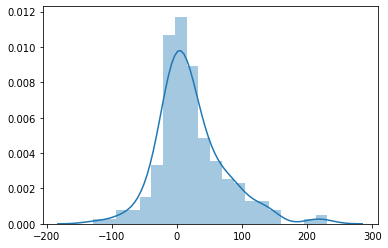

In [156]:
prediction=NN_model.predict(X_test)
sns.distplot(y_test.values-prediction)

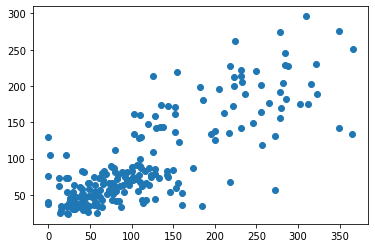

In [157]:
plt.scatter(y_test,prediction)

In [158]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 39.17998875900875
MSE: 3206.040704169385
RMSE: 56.62191010703706
